<a href="https://colab.research.google.com/github/AdonaiVera/cincipy_malaria/blob/main/%5BMalaria%5D_mainProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CASE OF USE
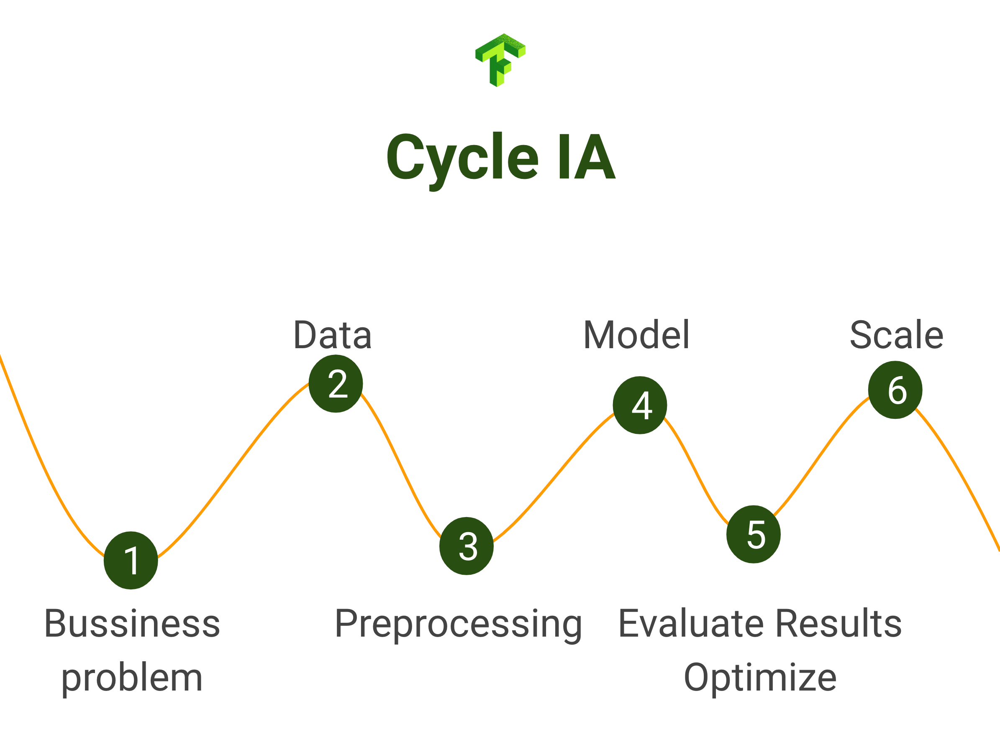

# Let's start

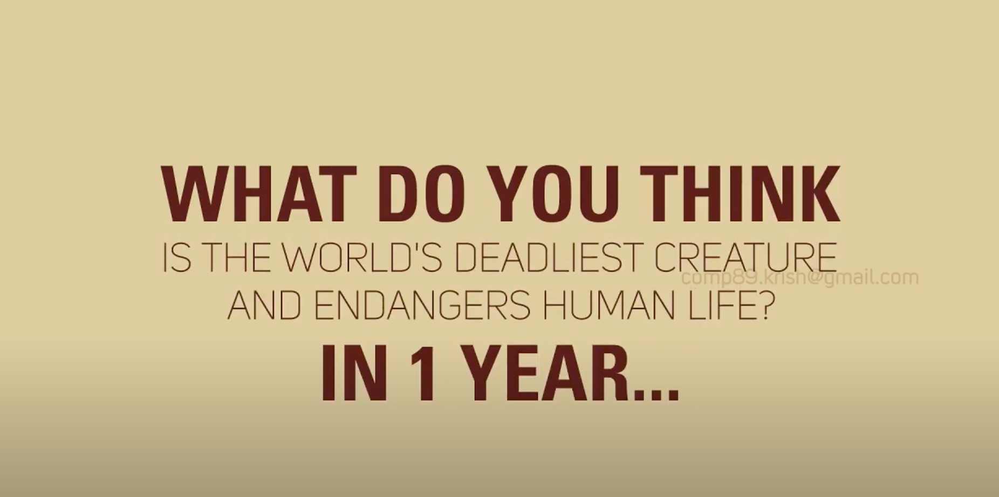

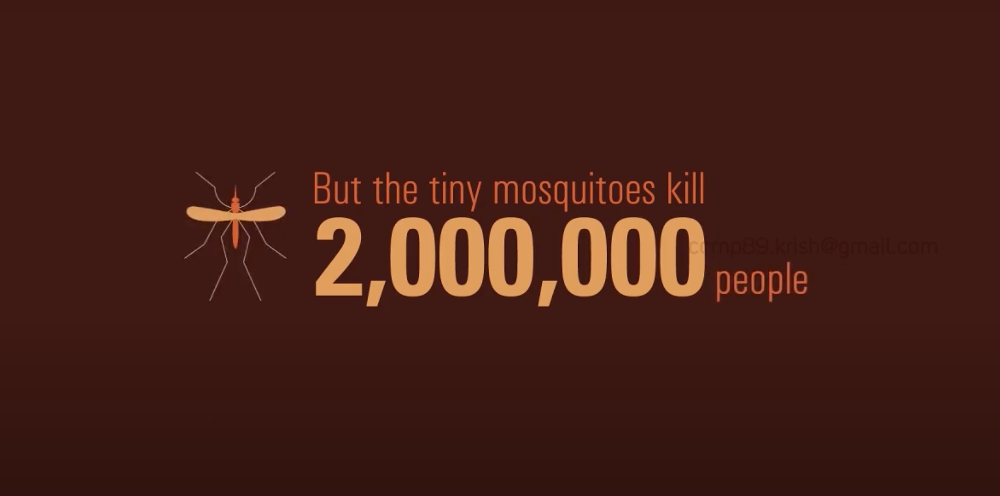

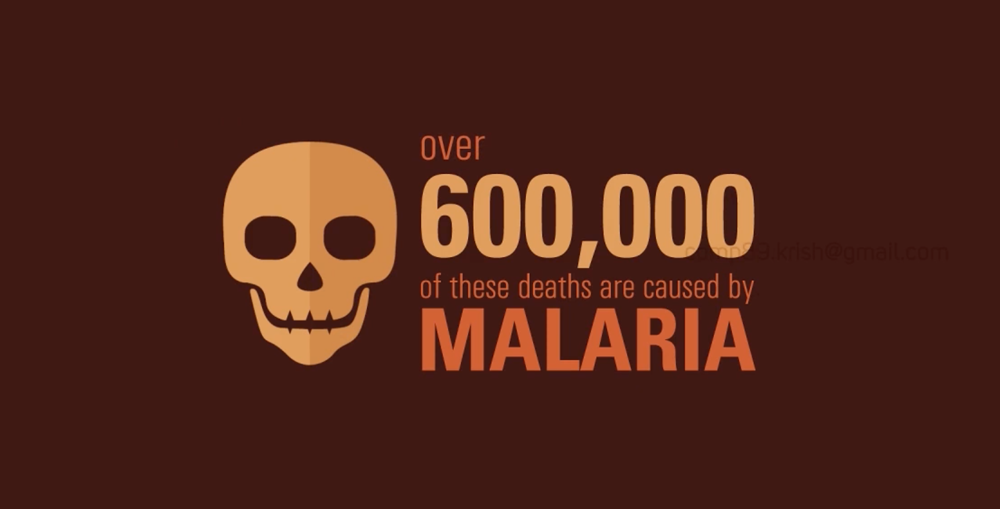

# Malaria detection with computer vision algorithms


Malaria is a disease caused by a parasite. The parasite is transmitted to humans through the bites of infected mosquitoes. People who have malaria usually feel very sick, with a high fever and shaking chills. Each year, approximately ***210 million*** people are infected with malaria, and about ***600,000*** people die from the disease. Most of the people who die from the disease are young children in Africa.

While the disease is uncommon in temperate climates, malaria is still common in tropical and subtropical countries. World health officials are trying to reduce the incidence of malaria by distributing bed nets to help protect people from mosquito bites as they sleep. Scientists around the world are working to develop a vaccine to prevent malaria.



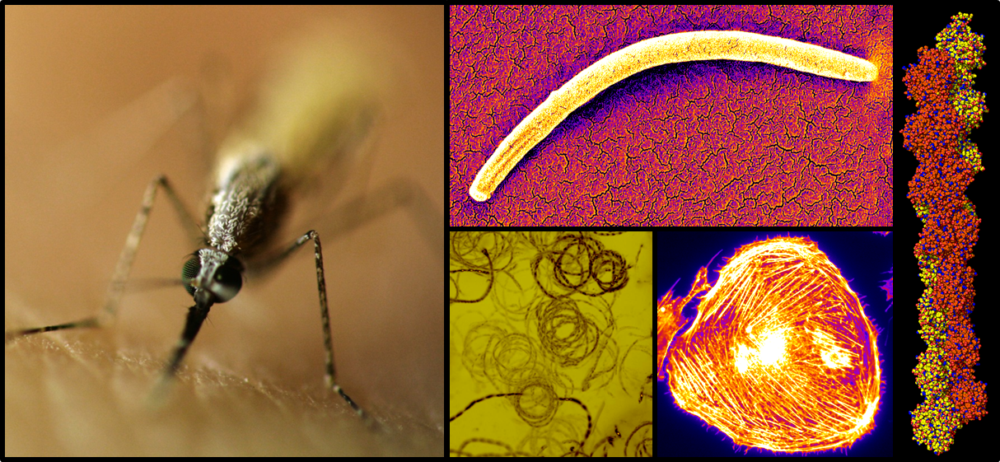

### DATASET
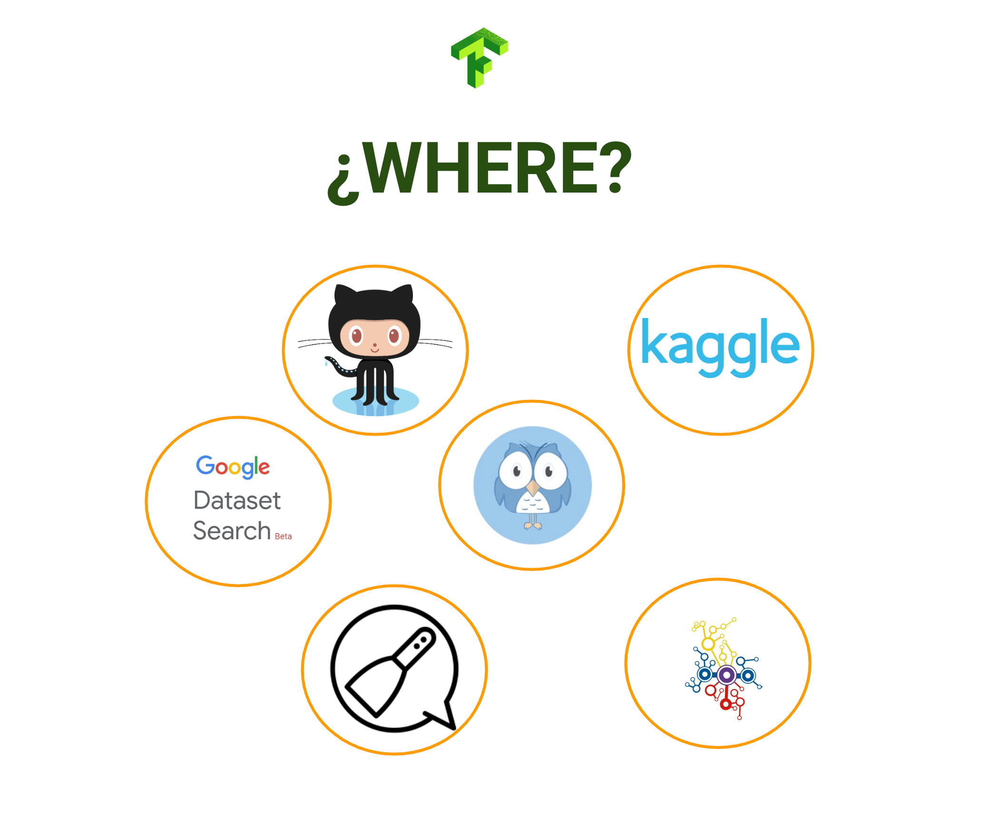

### [INFO] Dataset: 
This Dataset is taken from the official NIH Website: https://ceb.nlm.nih.gov/repositories/malaria-datasets/

Train 70% | Test 30 % 
2 Classes: Infected and Uninfected
And a total of 27,558 images.

In [ ]:
!wget --no-check-certificate https://storage.googleapis.com/platzi-tf2/MalariaCells.zip \
    -O /tmp/MalariaCells.zip

--2022-07-23 21:41:49--  https://storage.googleapis.com/platzi-tf2/MalariaCells.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.202.128, 74.125.197.128, 74.125.135.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.202.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 547750600 (522M) [application/zip]
Saving to: ‘/tmp/MalariaCells.zip’

/tmp/MalariaCells.z 100%[===================>] 522.38M  54.3MB/s    in 7.3s    

2022-07-23 21:41:56 (71.2 MB/s) - ‘/tmp/MalariaCells.zip’ saved [547750600/547750600]



## Unzip the database and store it in training and test folders
The following python code will use the OS library to use the OS libraries, which will give you access to the file system, and the zipfile library will allow you to unzip the data.

In the following Python code we use the OS library to be able to give access to the operating system files and then with the ZipFile library we decompress the database.

In [ ]:
import os
import zipfile

local_zip = "/tmp/MalariaCells.zip"
zip_ref = zipfile.ZipFile(local_zip, "r")
zip_ref.extractall("/tmp/MalariaCells")
zip_ref.close()

#### Load the main libraries

In [ ]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import string
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.preprocessing import image


## Find the address of our database
In this case the database is distributed in training and test. Each folder contains another subfolder where you have each of the database classes.

In [ ]:
train_dir = "/tmp/MalariaCells/Train"
test_dir = "/tmp/MalariaCells/Test"

## Lets talk about models

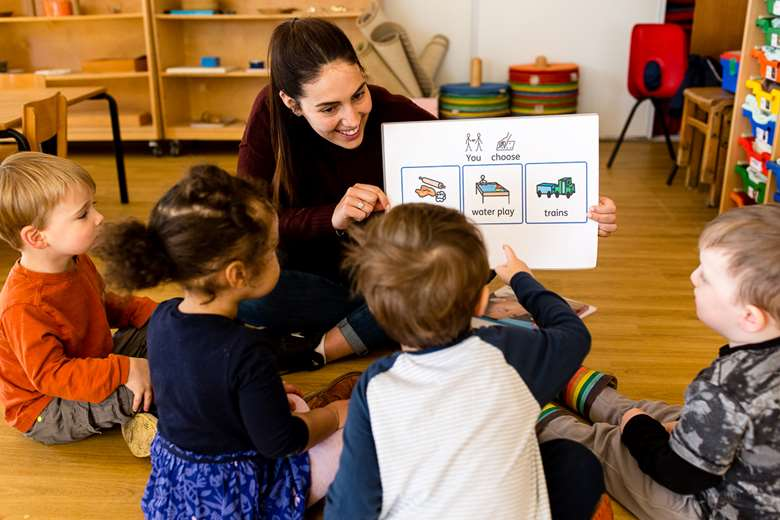

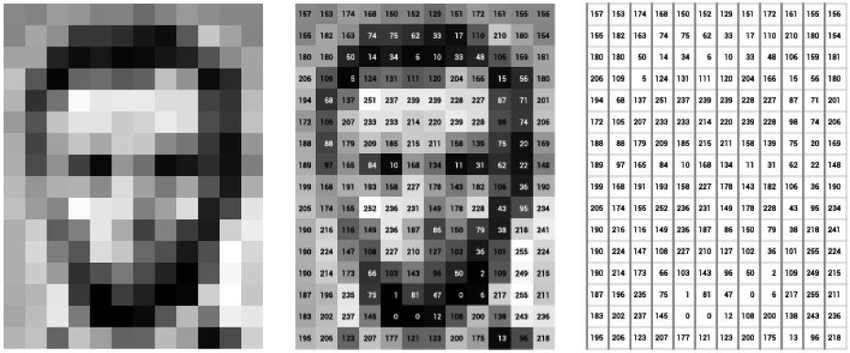

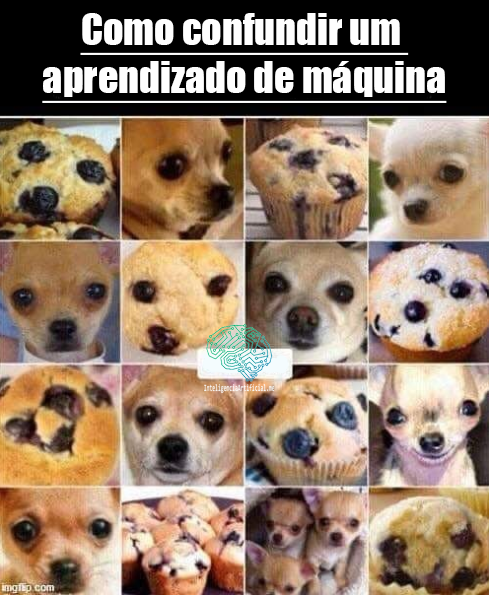

#### Define the classes of our database

In [ ]:
classes = ["Parasitized", "Uninfected"]

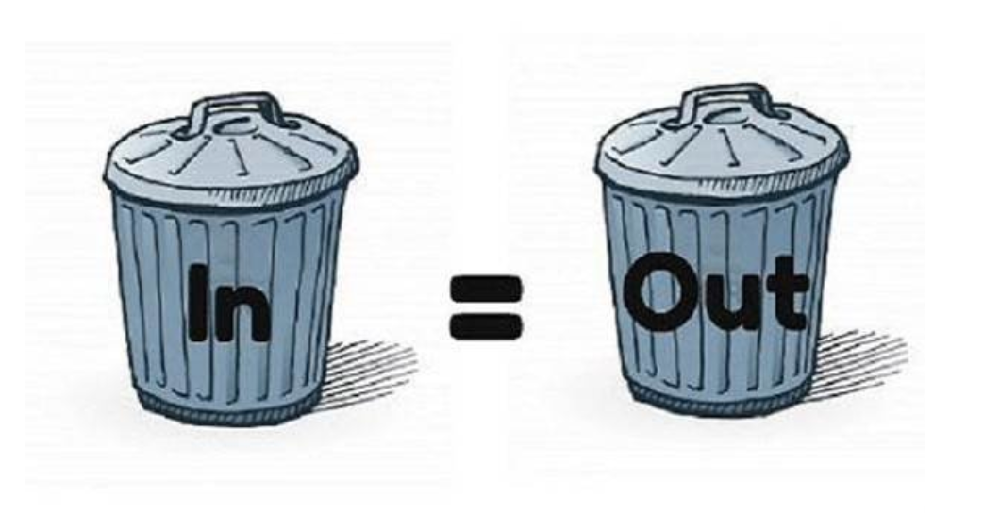

## Important to check in your dataset

*   Missing Values
*   Unbalanced data
*   Damaged images
*   Data with wrong labels
*   Noisy data

## Data Generators
Let's set up data generators that will read images in our source folders, convert them to `float32` tensors, and feed them (with their tags) to our network. We will have one generator for the training images and another one for the validation images. Our generators will produce batches of 150x150 size images and their labels.

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255)
test_datagen = ImageDataGenerator(rescale = 1/255, validation_split= 0.2)

In [ ]:
train_generator_resize = train_datagen.flow_from_directory(
    train_dir,
    target_size = (150, 150),
    batch_size = 128,
    class_mode = "binary",
    color_mode = "rgb",
    subset = "training"
)

validation_generator_resize = test_datagen.flow_from_directory(
    test_dir,
    target_size = (150, 150),
    batch_size = 128,
    class_mode = "binary",
    color_mode = "rgb",
    subset = "validation"
)

test_generator_resize = test_datagen.flow_from_directory(
    test_dir,
    target_size = (150, 150),
    batch_size = 128,
    class_mode = "binary",
    color_mode = "rgb"
)

Found 27558 images belonging to 2 classes.
Found 3166 images belonging to 2 classes.
Found 15832 images belonging to 2 classes.


## Some visualization of the data

In [ ]:
def plotImages(images_arr, label):
  fig, axes = plt.subplots(1, 5, figsize = (10, 10))
  axes = axes.flatten()
  nCountLabel = 0
  for img, ax in zip(images_arr, axes):
    ax.imshow(img) 
    ax.title.set_text('{}'.format('Parasitized' if label[nCountLabel] == 0 else 'Unifected'))
    ax.axis("off")
    nCountLabel+=1
  plt.tight_layout()  
  plt.show()


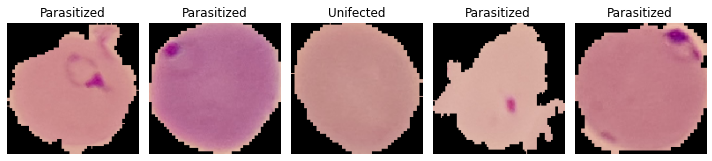

In [ ]:
sample_training_images, label= next(train_generator_resize)

plotImages(sample_training_images[:5], label[:5])

## We create the first trained model with Tensorflow
#### Preprocessing our database.
We must check what is the input of our models (Size of the input tensor)

In [ ]:
from tensorflow.python.keras.callbacks import TensorBoard
from time import time
callback_tensorboard = TensorBoard(log_dir = "logs/{}".format(time()))

#### Create the model -  Neural Network
Slope

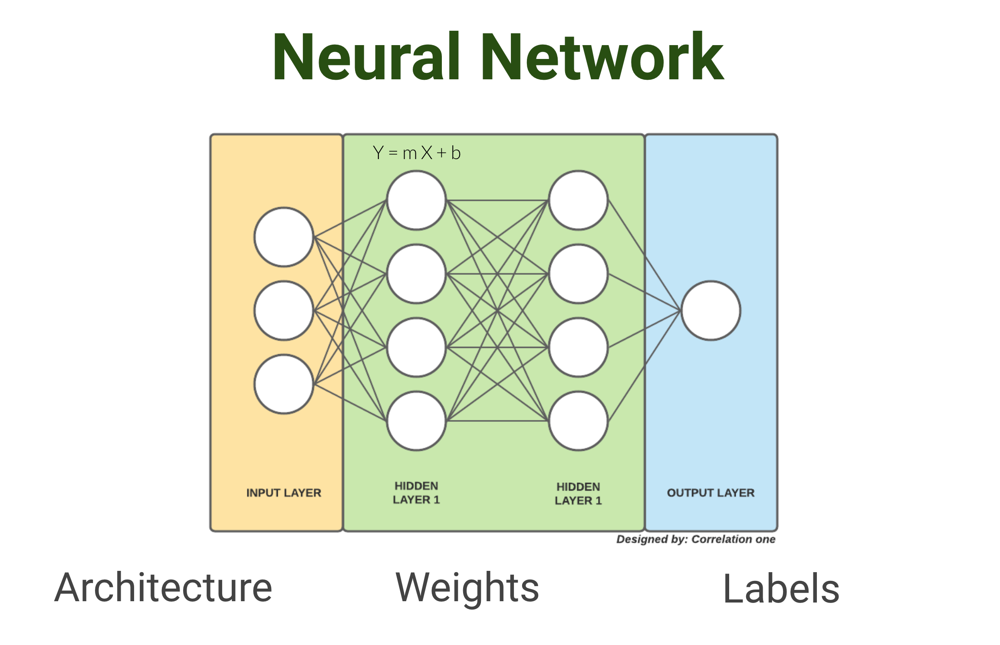

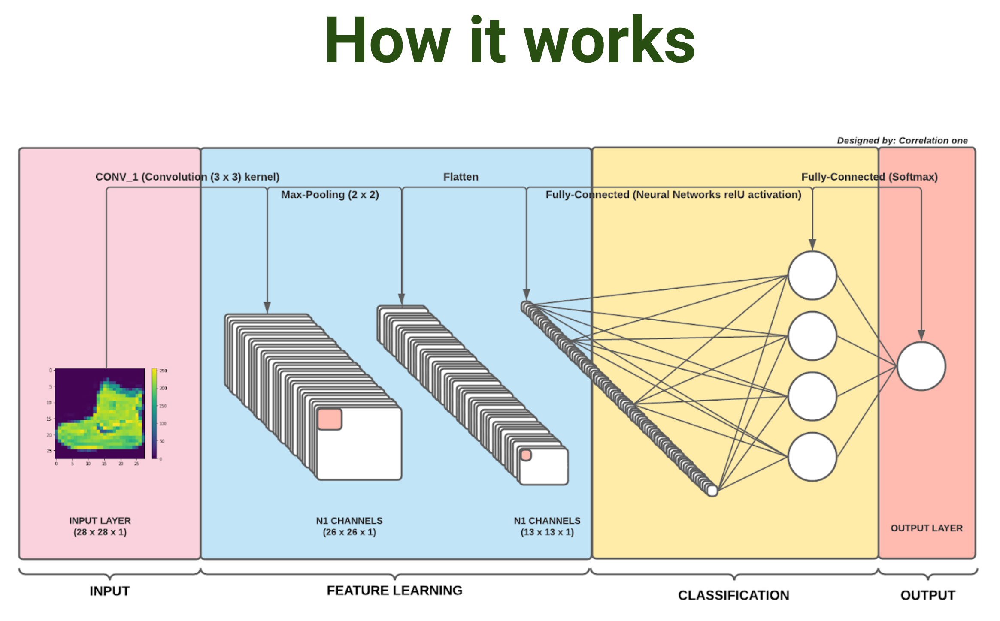

In [ ]:
malaria_detector =tf.keras.Sequential([
    tf.keras.layers.Conv2D(16,(3,3),input_shape=(150, 150, 3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(32,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
    
])



## Metrics
### Accuracy

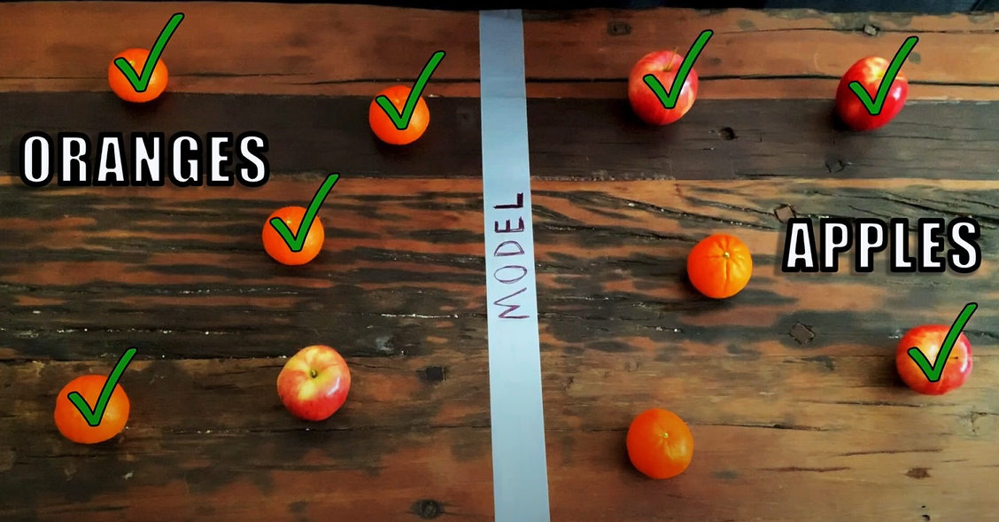

### Recall
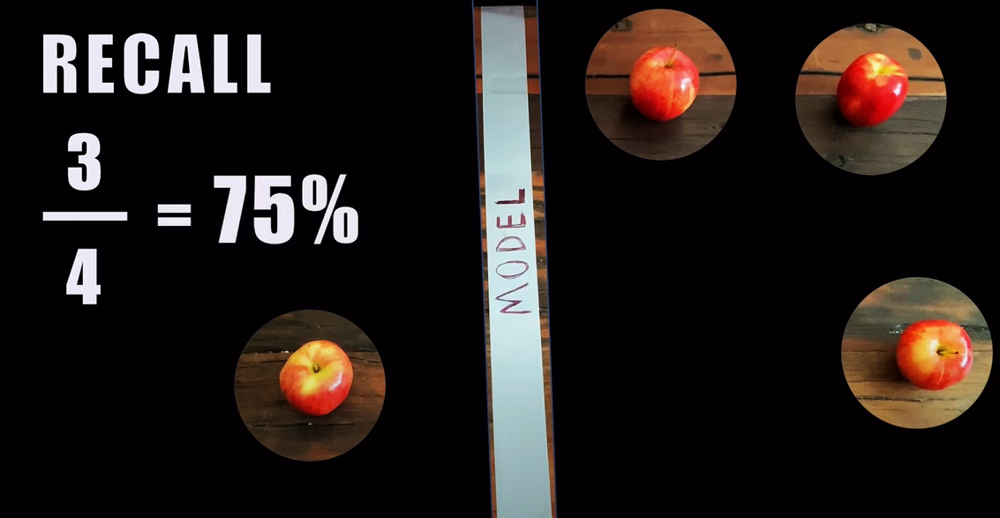

More info about metrics https://www.tensorflow.org/api_docs/python/tf/keras/metrics

In [ ]:
malaria_detector.compile(optimizer= "adam", loss = "binary_crossentropy", metrics = ["acc","Recall"])
malaria_detector.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 36, 36, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 64)        1

In [ ]:
history_keras = malaria_detector.fit(
    train_generator_resize,
    epochs = 20,
    validation_data = validation_generator_resize, 
    callbacks = [callback_tensorboard]
)

Epoch 1/20
216/216 [==============================] - 59s 211ms/step - loss: 0.4609 - acc: 0.7674 - binary_accuracy: 0.7674 - recall: 0.7775 - val_loss: 0.2313 - val_acc: 0.9150 - val_binary_accuracy: 0.9150 - val_recall: 0.9296
Epoch 2/20
216/216 [==============================] - 45s 207ms/step - loss: 0.1968 - acc: 0.9306 - binary_accuracy: 0.9306 - recall: 0.9356 - val_loss: 0.2101 - val_acc: 0.9305 - val_binary_accuracy: 0.9305 - val_recall: 0.9226
Epoch 3/20
216/216 [==============================] - 44s 202ms/step - loss: 0.1654 - acc: 0.9444 - binary_accuracy: 0.9444 - recall: 0.9485 - val_loss: 0.1711 - val_acc: 0.9321 - val_binary_accuracy: 0.9321 - val_recall: 0.9321
Epoch 4/20
216/216 [==============================] - 43s 200ms/step - loss: 0.1476 - acc: 0.9506 - binary_accuracy: 0.9506 - recall: 0.9586 - val_loss: 0.1607 - val_acc: 0.9321 - val_binary_accuracy: 0.9321 - val_recall: 0.9619
Epoch 5/20
216/216 [==============================] - 43s 200ms/step - loss: 0.1319 

In [ ]:
results = malaria_detector.evaluate(test_generator_resize)

124/124 [==============================] - 22s 175ms/step - loss: 0.0034 - acc: 0.9996 - binary_accuracy: 0.9996 - recall: 0.9996


## Connect to TensorBoard | We share the results with the whole world
Learn more about Tensorflow.dev [here](https://tensorboard.dev/)

In [ ]:
%load_ext tensorboard

In [ ]:
!tensorboard dev upload --logdir ./logs --name "Malaria projects CincyPy" --description "This is the results of the training" --one_shot


***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

./logs

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email&state=kSE0p9XKkffG740sUK8TChwx1V0kfe&prompt=consent&access_type=offline
Enter 

## Save and load the model
#### Use the .h5 format to save models.
Hierarchical Data Format (HDF5 format)

In [ ]:
!pip install pyyaml h5py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
malaria_detector.save("my_model.h5")

In [ ]:
model = tf.keras.models.load_model("my_model.h5")

## APP for the real Aplication


In [ ]:
# Read the image
from google.colab import files
uploaded = files.upload()

Saving C33P1thinF_IMG_20150619_114756a_cell_179.png to C33P1thinF_IMG_20150619_114756a_cell_179.png
Saving C4thin_original_IMG_20150608_170038_cell_123.png to C4thin_original_IMG_20150608_170038_cell_123 (1).png


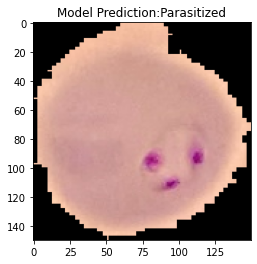

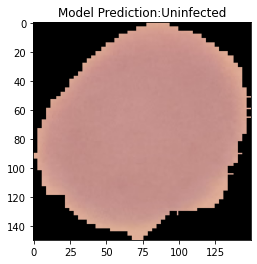

In [ ]:

for img_path in uploaded: 
    img = image.load_img(img_path, target_size=(150, 150))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    plt.imshow(img)
    plt.title(f"Model Prediction:{classes[int(predictions)]}")
    plt.show()


In [ ]:
results

[0.022809887304902077, 0.9924835562705994]

## What is next ?

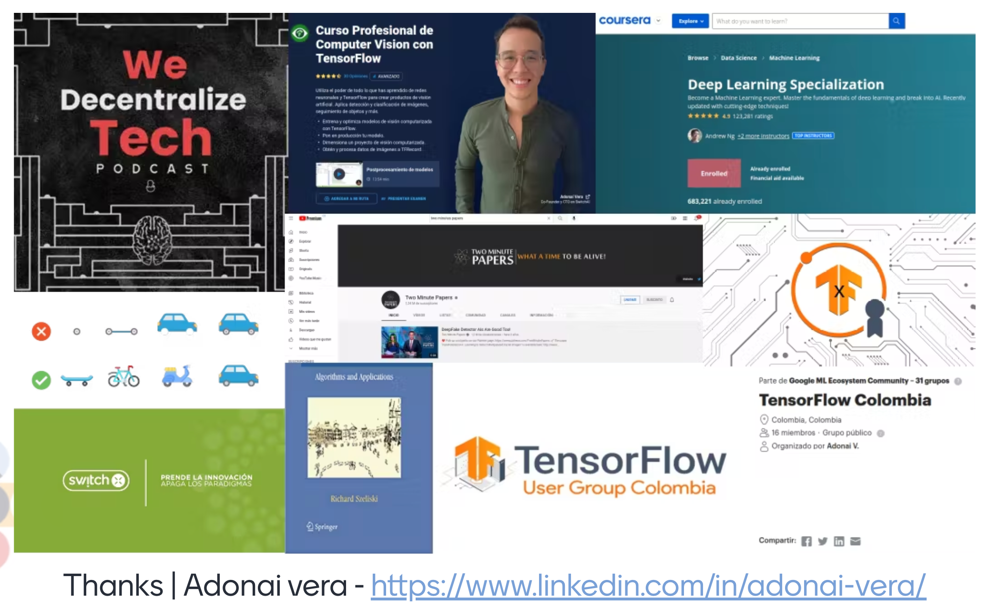